In [ ]:
import torch 
import torch.nn as nn
import torchvision
import torchvision.models as model
import cv2 
import copy
import numpy as np
import matplotlib.pyplot as plt
np.random.seed(0)
torch.manual_seed(0)

In [ ]:
def preprocess_image(img):
    """
        Processes image for CNNs
    Args:
        img :  numpy array to process
    returns:
        im_as_var (torch variable): Variable that contains processed float tensor
    """
    # mean and std list for channels (Imagenet)
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]

    im_as_arr = np.float32(img)
    im_as_arr = im_as_arr.transpose(2, 0, 1)  # Convert array to D,W,H
    # Normalize the channels
    for channel, _ in enumerate(im_as_arr):
        im_as_arr[channel] /= 255
        im_as_arr[channel] -= mean[channel]
        im_as_arr[channel] /= std[channel]
    # Convert to float tensor
    im_as_ten = torch.from_numpy(im_as_arr).float().cuda()
    # Add one more channel to the beginning. Tensor shape = 1,3,224,224
    im_as_ten.unsqueeze_(0)
    return im_as_ten.requires_grad_(True)

  
def recreate_image(tensor):
    """
        Recreates images from a torch variable, sort of reverse preprocessing
    Args:
        tensor (torch variable): Image to recreate
    returns:
        recreated_im (numpy arr): Recreated image in array
    """
    reverse_mean = [-0.485, -0.456, -0.406]
    reverse_std = [1/0.229, 1/0.224, 1/0.225]
    recreated_im = copy.copy(tensor.cpu().data.numpy()[0])
    for c in range(3):
        recreated_im[c] /= reverse_std[c]
        recreated_im[c] -= reverse_mean[c]
    recreated_im[recreated_im > 1] = 1
    recreated_im[recreated_im < 0] = 0
    recreated_im = np.round(recreated_im * 255)

    recreated_im = np.uint8(recreated_im).transpose(1, 2, 0)
    return recreated_im

In [ ]:
class SaveFeatures():
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output):
        self.features = output.requires_grad_(True).cuda()
    def close(self):
        self.hook.remove()

In [ ]:
normalize = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])

denormalize = torchvision.transforms.Normalize(mean=[-0.485, -0.456, -0.406],
                                     std=[1/0.229, 1/0.224, 1/0.225])


class CNNLayerVisualization():
    """
        Produces an image that minimizes the loss of a convolution
        operation for a specific layer and filter
    """
    def __init__(self, model):
        self.model = model
        self.model.eval()
        self.layers = list(self.model.children())


    def visualize(self, selected_layer, selected_filter, 
                  upscaling_steps=12, upscaling_factor=1.2,
                  size=48,  lr=0.1, opt_steps=20, blur=None, show=False):
        activations = SaveFeatures(self.layers[selected_layer])

        sz = size
        # Generate a random image
        img = np.uint8(np.random.uniform(150, 180, (sz, sz, 3))) / 255
        # Process image and return variable



        for _ in range(upscaling_steps):  # scale the image up upscaling_steps times
            # Define optimizer for the image
            img_var = preprocess_image(img)
            optimizer = torch.optim.Adam([img_var], lr=lr, weight_decay=1e-6)
            for n in range(opt_steps):  # optimize pixel values for opt_steps times
                optimizer.zero_grad()
                
                self.model(img_var)
                loss = -activations.features[0, selected_filter].mean()
                loss.backward()
                optimizer.step()
            img = recreate_image(img_var)
            self.output = img
            sz = int(upscaling_factor * sz)  # calculate new image size
            img = cv2.resize(img.astype('float32'), (sz, sz), interpolation = cv2.INTER_CUBIC)  # scale image up
            if blur is not None: img = cv2.blur(img,(blur,blur))  # blur image to reduce high frequency patterns
        if show:
          plt.imshow(self.output)
          plt.show()
          plt.close()
        return activations, self.output


In [ ]:
pretrained_model = model.vgg16(pretrained=True).features.cuda()
pretrained_model

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

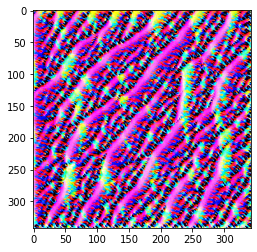

In [ ]:
cnn_layer = 7
filter_pos = 55

layer_vis = CNNLayerVisualization(pretrained_model)

activations = layer_vis.visualize(cnn_layer, filter_pos, size=48, show=True)[0]

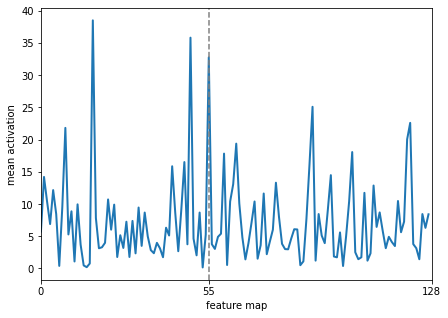

In [ ]:
total_filters_in_layer = 128

mean_act = [activations.features[0,i].mean().item() for i in range(total_filters_in_layer)]

plt.figure(figsize=(7,5))
act = plt.plot(mean_act,linewidth=2.)
extraticks=[filter_pos]
ax = act[0].axes
ax.set_xlim(0,total_filters_in_layer)
plt.axvline(x=filter_pos, color='grey', linestyle='--')
ax.set_xlabel("feature map")
ax.set_ylabel("mean activation")
ax.set_xticks([0, total_filters_in_layer] + extraticks)
#plt.show()
plt.savefig('mean_activation_layer_'+str(cnn_layer)+'_filter_'+str(filter_pos)+'.png')

In [ ]:
np.where(np.array(mean_act) > 30)

(array([17, 49, 55]),)

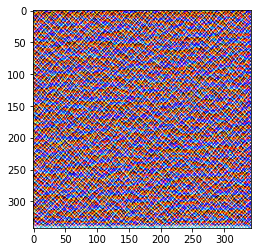

In [ ]:
activations = layer_vis.visualize(cnn_layer, 49, size=48, show=True)

In [ ]:
def plot_reconstructions(imgs,layer_idx,filters,n_cols=3, cell_size=4, save_fig=False,album_hash=None):
    n_rows = int(np.ceil((len(imgs))/n_cols))

    fig,axes = plt.subplots(n_rows,n_cols, figsize=(cell_size*n_cols,cell_size*n_rows))
          
    for i,ax in enumerate(axes.flat):
        ax.grid(False)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        if i>=len(filters):
            pass

        ax.set_title(f'fmap {filters[i]}')

        ax.imshow(imgs[i])
    fig.suptitle(f'VGG16 Layer: {layer_idx} : {layer_vis.layers[layer_idx]}', fontsize="x-large",y=1.0)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    if save_fig:
        plt.savefig(f'vgg16_layer_{layer_idx}_fmaps_{"_".join([str(f) for f in filters])}.png')
        link = upload_to_imgur(f'vgg16_layer_{layer_idx}_fmaps_{"_".join([str(f) for f in filters])}.png',
                        f'vgg16_layer_{layer_idx}_fmaps_{"_".join([str(f) for f in filters])}',album_hash)
        plt.close()
        return link
    else:
        plt.show()
        return None

In [ ]:
def reconstructions(layer_idx, filters,
                    init_size=56, upscaling_steps=12, 
                    upscaling_factor=1.2, 
                    opt_steps=20, blur=5,
                    lr=1e-1,print_losses=False,
                    n_cols=5, cell_size=4,
                    save_fig=False,
                    album_hash=None):
    
    if save_fig:
        assert not album_hash is None
    imgs = []
    for filter in filters:
        print("Creates Images: {}/{}".format(filter, len(filters)), end="\r")
        imgs.append(layer_vis.visualize(layer_idx, filter)[1])
    print()
        
    return plot_reconstructions(imgs,layer_idx,filters,
                         n_cols=n_cols,cell_size=cell_size,
                         save_fig=save_fig,album_hash=album_hash)

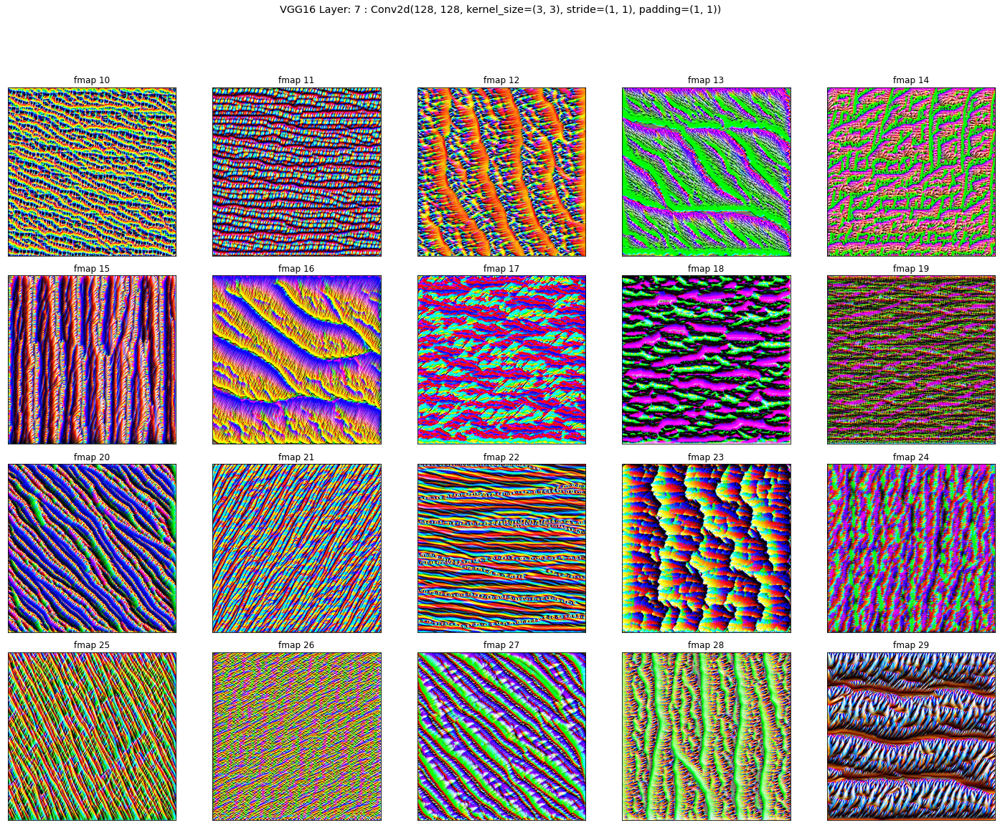

In [ ]:
reconstructions(layer_idx=7, filters=list(range(10,30)))

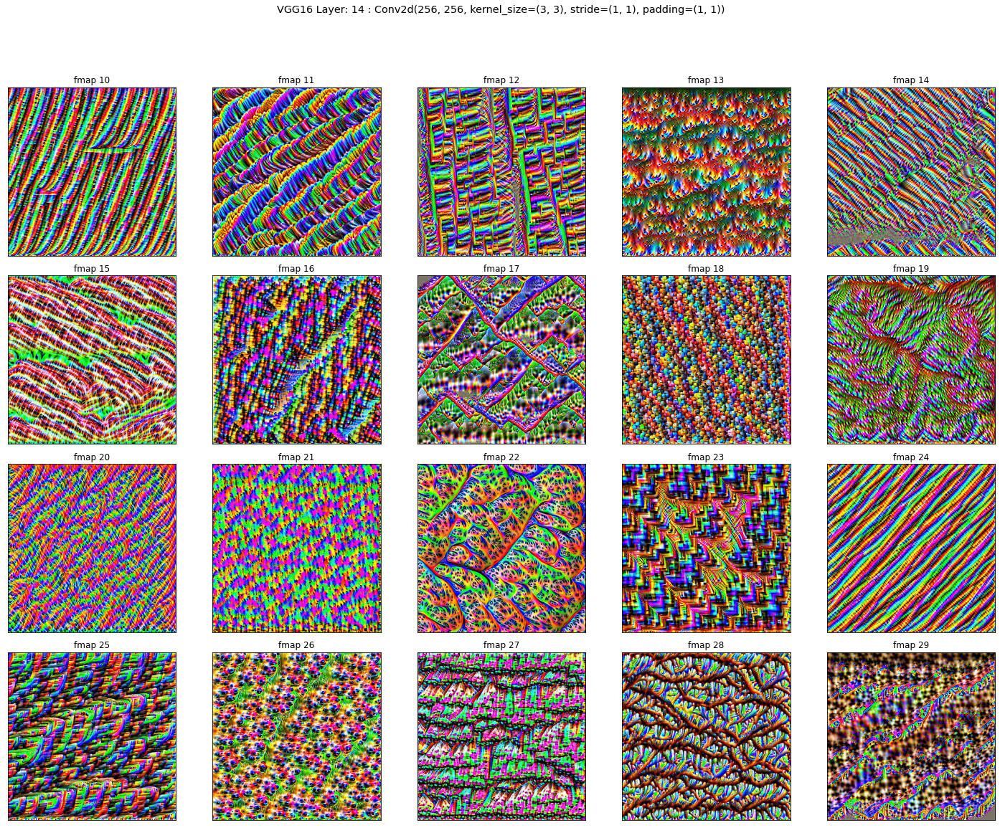

In [ ]:
reconstructions(layer_idx=14, filters=list(range(10,30)))

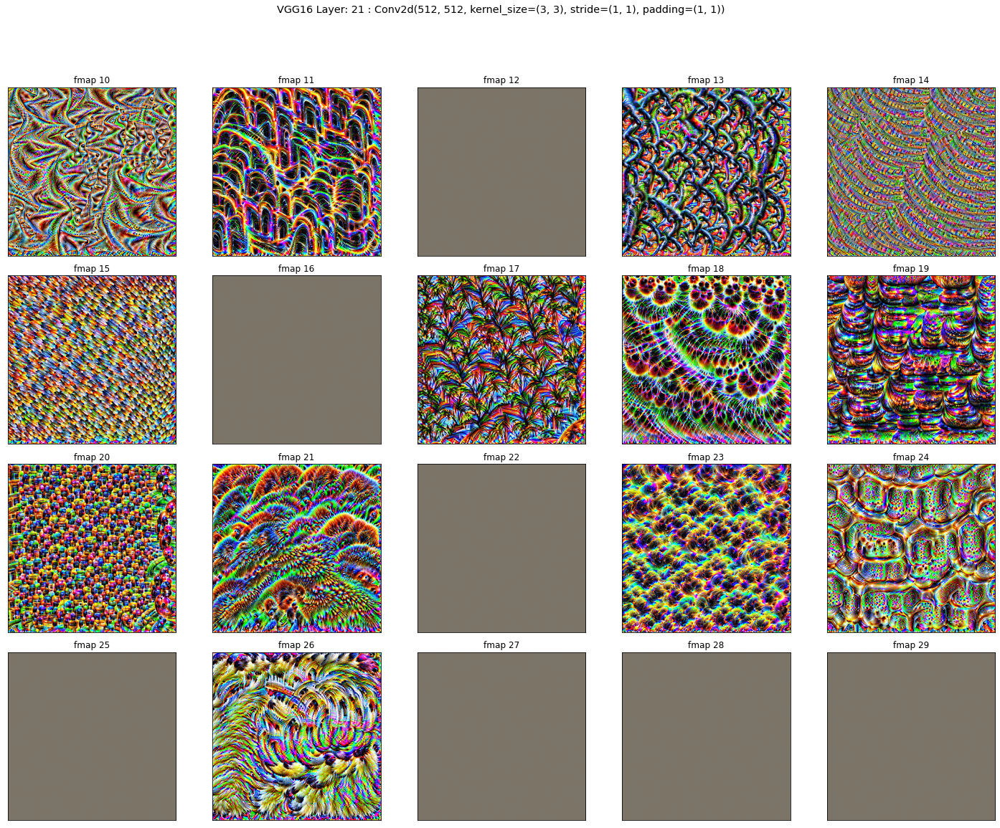

In [ ]:
reconstructions(layer_idx=21, filters=list(range(10,30)))

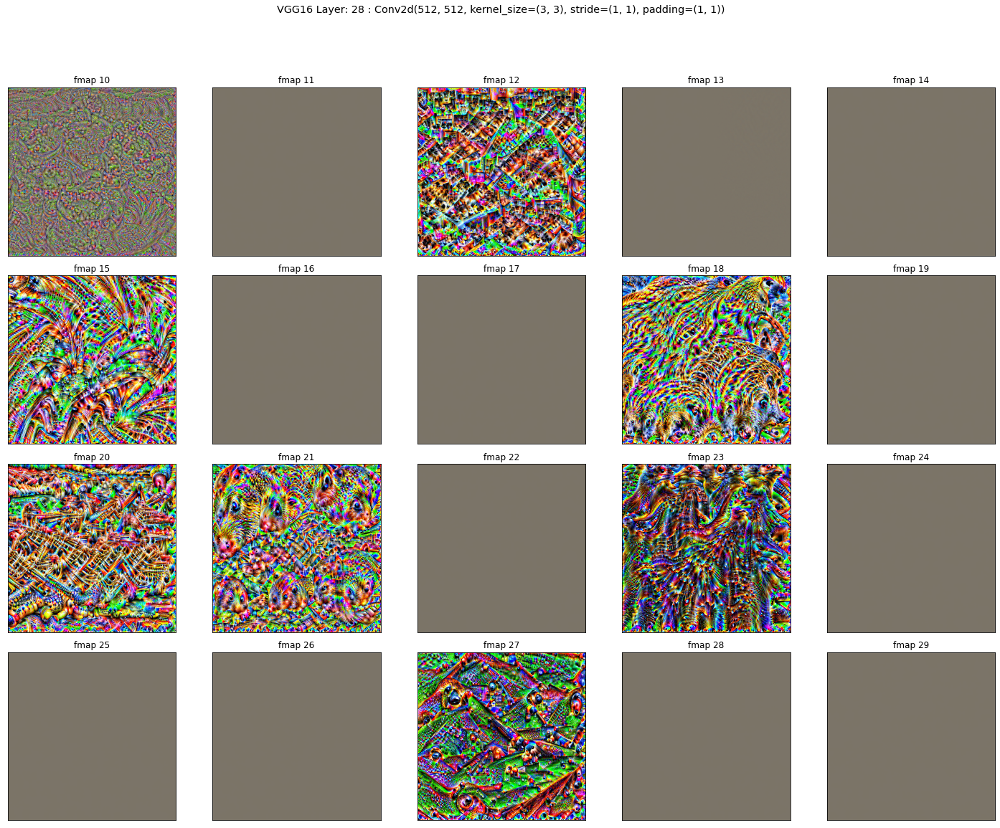

In [ ]:
reconstructions(layer_idx=28, filters=list(range(10,30)))